# *Indian Institute of Technology Bombay*
## EE 782 : Advanced Topics in Machine Learning
## Assignment - 2 (Part B)
## Siamese Networks & C-GAN

### by:
### Uddeshya Singh
### Rollno: 22m2152  
### Contact no.: 8755599692
### CMiNDS , Artifical Intellligence & Data Science

*********************

### **Modules Covered**

*********************

1. ##### Dataset Creation:
    - Making the Dataset
    - Making Dataloader
    
   
*********************    
    
2. ##### Definig GAN
    - Defining Generator
    - Defining Discriminator
    - Defining Initialisation
    - Defining WGAN penalty
    - Training Loop Image Generation 
 
*********************

3. ##### BONUS : Defining C-GAN
    - Instantiating our Siamese Network
    - Defining Conditional Generator
    - Defining Caondtional Discriminator
    - Image Generation with Siamese w\o penalisation
    - Image generation with Siamese with penalisation
   


## - Importing Libraries

In [1]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import os
import torchvision
import torch
import torch.nn as nn
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import tqdm
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
import timm
from tqdm.notebook import tqdm as notebook_tqdm 

Reference : https://www.youtube.com/playlist?list=PLhhyoLH6IjfwIp8bZnzX8QR30TRcHO8Va

### 11. Train a generative model for generating face images, using a GAN. The generator takes a Gaussian noise vector as input, and tries to output a face image, while the discriminator distinguishes between real and fake face images.


In [20]:
device = "cuda" if torch.cuda.is_available() else "cpu"
LEARNING_RATE = 1e-4
BATCH_SIZE = 64
IMAGE_SIZE = 64
CHANNELS_IMG = 3
Z_DIM = 100
NUM_EPOCHS = 100
FEATURES_CRITIC = 64
FEATURES_GEN = 64
CRITIC_ITERATIONS = 5
LAMBDA_GP = 10

### - Data Preprocessing step

In [3]:
def preprocess_and_save_images(input_dir, output_dir, set_name, custom_size=None, crop=False , crop_size = (124, 124)):
    set_output_dir = os.path.join(output_dir, set_name)
    if os.path.exists(set_output_dir):
        print(f"Output directory '{set_output_dir}' already exists. Skipping preprocessing.")
        return
    
    os.makedirs(set_output_dir, exist_ok=True)
    transform_list = [
        transforms.Resize(custom_size) if custom_size is not None else transforms.Resize((224, 224)),
        transforms.CenterCrop(crop_size) if crop and custom_size is not None else transforms.Resize(custom_size),
        transforms.ToTensor(),
    
    ]

    transform = transforms.Compose(transform_list)
    for person in os.listdir(input_dir):
        person_dir = os.path.join(input_dir, person)
        output_person_dir = os.path.join(set_output_dir, person)
        if os.path.exists(output_person_dir):
            print(f"Output directory '{output_person_dir}' for '{person}' already exists. Skipping preprocessing.")
            continue
        
        os.makedirs(output_person_dir, exist_ok=True)
        for image_name in os.listdir(person_dir):
            input_image_path = os.path.join(person_dir, image_name)
            output_image_path = os.path.join(output_person_dir, image_name)
            image = Image.open(input_image_path)
            image = transform(image)
            image = transforms.ToPILImage()(image)
            image.save(output_image_path)

In [5]:
input_dir = "/raid/biplab/phduser1/Uddeshya/lfw"
output_dir = "/raid/biplab/phduser1/Uddeshya/GANS/dataset"
preprocess_and_save_images(input_dir, output_dir, "cropped", custom_size=(224, 224), crop=True )

Output directory '/raid/biplab/phduser1/Uddeshya/GANS/dataset/cropped' already exists. Skipping preprocessing.


In [3]:
extract_path = "/raid/biplab/phduser1/Uddeshya/GANS/dataset/cropped"
lfw_contents = os.listdir(extract_path)

sample_contents = lfw_contents[:10]
sample_contents

['Maria_Guida',
 'Lon_Kruger',
 'Dennis_Miller',
 'Nathalia_Gillot',
 'Camryn_Manheim',
 'Justin_Timberlake',
 'Vanessa_Laine',
 'Ion_Tiriac',
 'Stephen_Swindal',
 'Sandra_Shamas']

In [4]:
transforms = transforms.Compose(
    [
        transforms.Resize(IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Normalize(
            [0.5 for _ in range(CHANNELS_IMG)], [0.5 for _ in range(CHANNELS_IMG)]
        ),
    ]
)

### - Creating a Dataset

In [5]:
class LFWDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        
        # Collect all image file paths
        self.image_paths = []
        for person_dir in os.listdir(root_dir):
            person_path = os.path.join(root_dir, person_dir)
            for image_name in os.listdir(person_path):
                self.image_paths.append(os.path.join(person_path, image_name))

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

### - Creating DataLoader

In [6]:
dataset = LFWDataset(root_dir=extract_path, transform=transforms)
batch_size = 64
loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

In [7]:
def imshow(img):
    img = img.cpu() / 2 + 0.5  # Move tensor to CPU and then denormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

### - Defining Discriminator

- Upon feeding a 64x64 RGB image to the discriminator, the first convolutional layer halve the image's spatial dimensions, resulting in an output with a shape of [batch_size, 16, 32, 32]. 
- While the LeakyReLU activation retains this shape, subsequent layers further process the image. 
- Each _block in the sequence doubles the depth (number of feature maps) and halves the spatial dimensions. 
- Thus, after the three blocks, the processed image has a shape of [batch_size, 128, 4, 4]. 
- The last convolution layer streamlines the depth to a single channel, yielding an output of shape [batch_size, 1, 1, 1]. 
- This final output indicates the discriminator's confidence in the input image being genuine.

Refernece: Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks

In [17]:
class Discriminator(nn.Module):
    def __init__(self, channels_img, features_d):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            
            nn.Conv2d(channels_img, features_d, kernel_size=4, stride=2, padding=1), # Initial convolutional layer that halves the image's spatial dimensions
            nn.LeakyReLU(0.2),   # Activation function to introduce non-linearity
            self._block(features_d, features_d * 2, 4, 2, 1), # Convolutional block that doubles the depth and halves the spatial size
            self._block(features_d * 2, features_d * 4, 4, 2, 1), # Another convolutional block; depth increases further and size reduces
            self._block(features_d * 4, features_d * 8, 4, 2, 1), # Yet another convolutional block; even more depth, smaller size
            nn.Conv2d(features_d * 8, 1, kernel_size=4, stride=2, padding=0),
             # Final convolution to get a single value representing discriminator's confidence
        )
    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False,
            ),
            nn.InstanceNorm2d(out_channels, affine=True),
            nn.LeakyReLU(0.2),
        )
    def forward(self, x):
        return self.disc(x)

Reference : https://www.youtube.com/playlist?list=PLhhyoLH6IjfwIp8bZnzX8QR30TRcHO8Va

### - Defining Generator

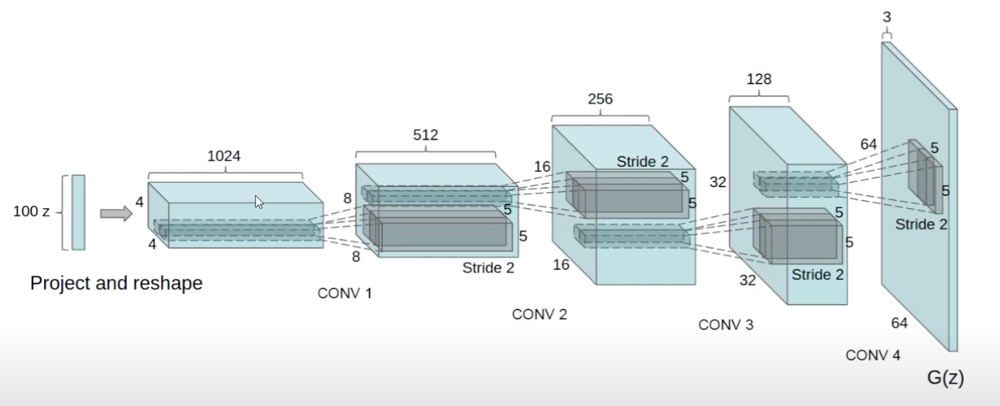

- Starting with a noise tensor of shape [batch_size, channels_noise, 1, 1], the Generator begins its upsampling process. 
- The initial block expands the tensor to have a shape of [batch_size, features_g * 16, 4, 4], essentially creating a 4x4 image with a depth of 16 times the features_g. 
- As the tensor progresses through the sequential blocks, it undergoes a series of transposed convolutions that double its spatial dimensions while halving its depth at each step. 
- After processing through the sequence, the tensor evolves into a 32x32 image with depth equal to twice the features_g. 
- The concluding transposed convolution layer further expands the spatial size to 64x64 while compressing its depth to match the desired image channels, channels_img. 
- The output image, now of shape [batch_size, channels_img, 64, 64], is then passed through a Tanh activation function to ensure pixel values lie between -1 and 1, producing the Generator's final synthetic image.

In [10]:
class Generator(nn.Module):
    def __init__(self, channels_noise, channels_img, features_g):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            # Input: N x channels_noise x 1 x 1
            self._block(channels_noise, features_g * 16, 4, 1, 0),  # img 4x4
            self._block(features_g * 16, features_g * 8, 4, 2, 1),  # img 8x8
            self._block(features_g * 8, features_g * 4, 4, 2, 1),  # img 16x16
            self._block(features_g * 4, features_g * 2, 4, 2, 1),  # img 32x32
            nn.ConvTranspose2d(
                features_g * 2, channels_img, kernel_size=4, stride=2, padding=1
            ),
            # N x channels_img x 64 x 64
            nn.Tanh(),
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False,
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )

    def forward(self, x):
        return self.net(x)

References: https://www.youtube.com/playlist?list=PLhhyoLH6IjfwIp8bZnzX8QR30TRcHO8Va

### - Weight Initialisation

In [11]:
def initialize_weights(model):
    # Initializes weights according to the DCGAN paper
    for m in model.modules():
        if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
            nn.init.normal_(m.weight.data, 0.0, 0.02)

### - WGAN Penalty

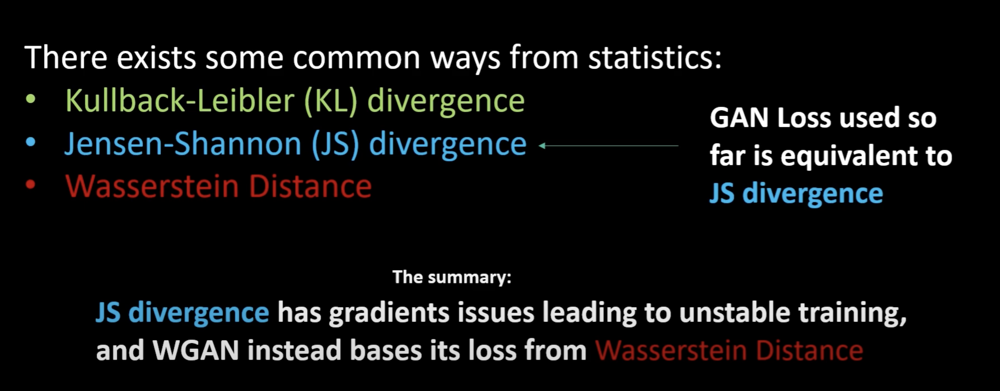

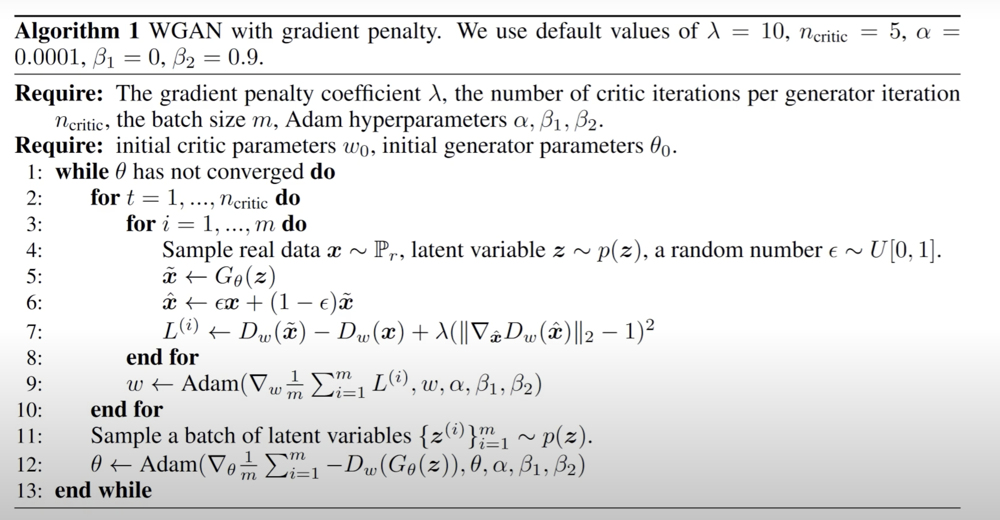

- The gradient_penalty function computes the gradient penalty based on the method proposed in the Wasserstein GAN with Gradient Penalty (WGAN-GP) paper. This penalty is used to ensure that the discriminator (referred to as critic in the context of WGANs) provides gradients of the correct magnitude for all inputs, which in turn stabilizes the training process.

-  Given real images and their corresponding fake counterparts, the function creates interpolated images. This is done by generating random values, alpha, which lie between 0 and 1. Each value of alpha determines the mix ratio between a real and fake image. The interpolated image is then given by real * alpha + fake * (1 - alpha)

- These interpolated images are then passed through the critic, resulting in mixed_scores which represent the critic's evaluations of the interpolated images.

- The gradient of the mixed_scores with respect to the interpolated images is computed. This gradient essentially measures how the critic's scores would change with slight perturbations in the interpolated image.

- The norm of this gradient is computed and is expected to be close to 1 for the critic to be a 1-Lipschitz function, as desired for the WGAN-GP framework. The penalty is then calculated as the mean squared deviation of the gradient norm from 1. This penalty is added to the critic's loss during training to ensure the critic provides suitable gradients, ensuring a more stable GAN training process.

In [12]:
def gradient_penalty(critic, real, fake, device="cpu"):
    BATCH_SIZE, C, H, W = real.shape
    alpha = torch.rand((BATCH_SIZE, 1, 1, 1)).repeat(1, C, H, W).to(device) # creating constant for interpolated images
    interpolated_images = real * alpha + fake * (1 - alpha) # interpolation of images 
    mixed_scores = critic(interpolated_images)# Calculate critic scores

    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]  # getting the first dimension                                   # Take the gradient of the scores with respect to the images
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

Reference : https://www.youtube.com/playlist?list=PLhhyoLH6IjfwIp8bZnzX8QR30TRcHO8Va

### - Instantiation

In [21]:
gen = Generator(Z_DIM, CHANNELS_IMG, FEATURES_GEN).to(device)
critic = Discriminator(CHANNELS_IMG, FEATURES_CRITIC).to(device)
initialize_weights(gen)
initialize_weights(critic)

### - Training Loop

- Training the Critic:

    - The critic is trained multiple times in a single generator's training iteration. This is a common practice in WGANs to   ensure the critic is well-trained and provides meaningful gradients.
    - The critic's loss is a combination of the differences in scores between the real and fake images and the gradient penalty. The aim is to make the critic better at distinguishing real images from fake ones while adhering to the Lipschitz constraint.

- Training the Generator:
    
    - Using the same fake images, the critic's evaluation (gen_fake) provides feedback on the generator's performance.
The generator's loss aims to maximize the critic's score for the generated images. In essence, the generator is being trained to "fool" the critic into thinking the fake images are real.     

Reference : WGAN Paper : https://arxiv.org/abs/1701.07875

In [15]:
def train_gan_v2(gen, critic, dataloader, num_epochs, z_dim, device, lr, betas, critic_iterations, lambda_gp, display_step=5):
    # Optimizers used according to WGAN paper
    opt_gen = optim.Adam(gen.parameters(), lr=lr, betas=betas)
    opt_critic = optim.Adam(critic.parameters(), lr=lr, betas=betas)
    fixed_noise = torch.randn(10, z_dim, 1, 1).to(device)
    
    # Lists to store losses for plotting
    gen_losses = []
    critic_losses = []

    gen.train()
    critic.train()
    progress_bar = tqdm(range(num_epochs), desc="Training Progress")

    for epoch in progress_bar:
        total_gen_acc = 0.0
        total_disc_real_acc = 0.0
        total_disc_fake_acc = 0.0
        total_batches = 0

        for batch_idx, real in enumerate(dataloader):
            real = real.to(device)
            cur_batch_size = real.shape[0]

            # Train Critic several times before training generator one time
            for _ in range(critic_iterations):
                noise = torch.randn(cur_batch_size, z_dim, 1, 1).to(device) # making our custom noise for the generator
                fake = gen(noise)
                critic_real = critic(real).reshape(-1) # extract the values
                critic_fake = critic(fake).reshape(-1) # extracting the values
                gp = gradient_penalty(critic, real, fake, device=device)
                loss_critic = -(torch.mean(critic_real) - torch.mean(critic_fake)) + lambda_gp * gp ## as we want to maximise these
                critic.zero_grad()
                loss_critic.backward(retain_graph=True) # reutilising the computation such as for fake defined above
                opt_critic.step()
                critic_losses.append(loss_critic.item())

            # Training of  Generator
            gen_fake = critic(fake).reshape(-1)
            loss_gen = -torch.mean(gen_fake) # maximising the loss (using minus sign)
            gen.zero_grad()
            loss_gen.backward()
            opt_gen.step()
            gen_losses.append(loss_gen.item())

            # Accumulate metrics
            with torch.no_grad():
                total_gen_acc += torch.mean(critic(fake)).item()
                total_disc_real_acc += torch.mean(critic_real).item()
                total_disc_fake_acc += torch.mean(critic_fake).item()
            total_batches += 1

            if batch_idx % 800 == 0 and batch_idx > 0:
                print(f"Epoch [{epoch}/{num_epochs}] Batch {batch_idx}/{len(dataloader)} \
                      Loss D: {loss_critic:.4f}, loss G: {loss_gen:.4f}")

        # Compute average accuracies
        avg_gen_acc = total_gen_acc / total_batches
        avg_disc_real_acc = total_disc_real_acc / total_batches
        avg_disc_fake_acc = total_disc_fake_acc / total_batches

        # Print average accuracies for the epoch
        print(f"Epoch [{epoch}/{num_epochs}]: Avg Gen Acc: {avg_gen_acc:.4f}, Avg Disc Real Acc: {avg_disc_real_acc:.4f}, Avg Disc Fake Acc: {avg_disc_fake_acc:.4f}")

        if epoch % display_step == 0:
            with torch.no_grad():
                fake = gen(fixed_noise)
                img_grid_fake = torchvision.utils.make_grid(fake, nrow=5, normalize=True)
                plt.figure(figsize=(10, 4))
                plt.imshow(img_grid_fake.permute(1, 2, 0).cpu())
                plt.axis('off')
                plt.show()

    # Plot losses
    plt.figure(figsize=(10,5))
    plt.title("Generator and Critic Loss During Training")
    plt.plot(gen_losses,label="G")
    plt.plot(critic_losses,label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

    return gen, critic

Reference : https://www.youtube.com/playlist?list=PLhhyoLH6IjfwIp8bZnzX8QR30TRcHO8Va

Training Progress:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch [0/100]: Avg Gen Acc: -50.7050, Avg Disc Real Acc: 44.5474, Avg Disc Fake Acc: -50.6437


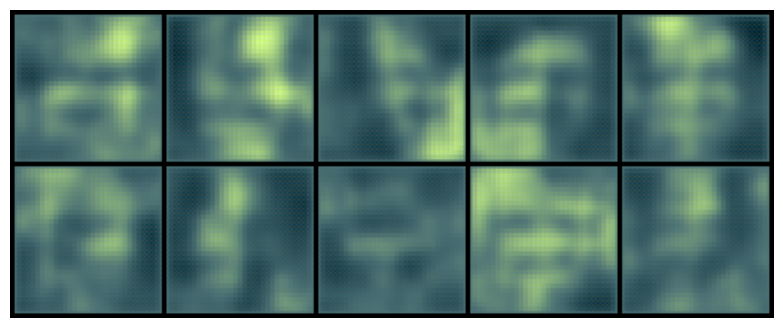

Training Progress:   2%|▏         | 2/100 [01:31<1:14:11, 45.42s/it]

Epoch [1/100]: Avg Gen Acc: -103.9352, Avg Disc Real Acc: 31.6043, Avg Disc Fake Acc: -103.8244


Training Progress:   3%|▎         | 3/100 [02:15<1:13:02, 45.18s/it]

Epoch [2/100]: Avg Gen Acc: -101.0455, Avg Disc Real Acc: -20.3323, Avg Disc Fake Acc: -101.1560


Training Progress:   4%|▍         | 4/100 [03:00<1:11:39, 44.78s/it]

Epoch [3/100]: Avg Gen Acc: -96.1310, Avg Disc Real Acc: -57.5838, Avg Disc Fake Acc: -95.8308


Training Progress:   5%|▌         | 5/100 [03:41<1:09:04, 43.62s/it]

Epoch [4/100]: Avg Gen Acc: -86.3172, Avg Disc Real Acc: -63.5108, Avg Disc Fake Acc: -85.8445
Epoch [5/100]: Avg Gen Acc: -78.3528, Avg Disc Real Acc: -62.5264, Avg Disc Fake Acc: -78.0344


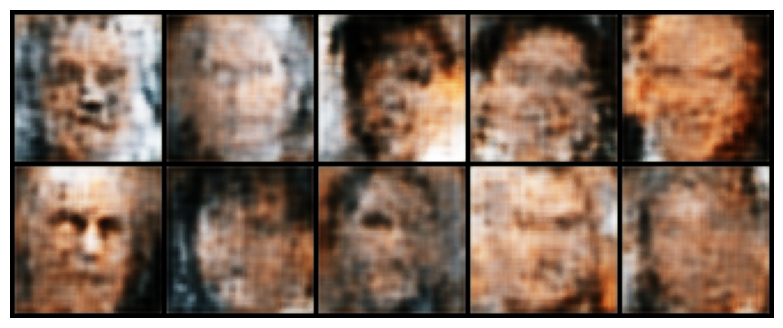

Training Progress:   7%|▋         | 7/100 [05:02<1:04:49, 41.82s/it]

Epoch [6/100]: Avg Gen Acc: -75.0703, Avg Disc Real Acc: -62.1312, Avg Disc Fake Acc: -74.6122


Training Progress:   8%|▊         | 8/100 [05:41<1:02:45, 40.92s/it]

Epoch [7/100]: Avg Gen Acc: -72.1391, Avg Disc Real Acc: -60.1558, Avg Disc Fake Acc: -71.5262


Training Progress:   9%|▉         | 9/100 [06:21<1:01:23, 40.48s/it]

Epoch [8/100]: Avg Gen Acc: -70.7098, Avg Disc Real Acc: -59.5836, Avg Disc Fake Acc: -70.0420


Training Progress:  10%|█         | 10/100 [06:59<59:58, 39.98s/it] 

Epoch [9/100]: Avg Gen Acc: -69.3901, Avg Disc Real Acc: -58.8420, Avg Disc Fake Acc: -68.9353
Epoch [10/100]: Avg Gen Acc: -69.0802, Avg Disc Real Acc: -58.7051, Avg Disc Fake Acc: -68.3870


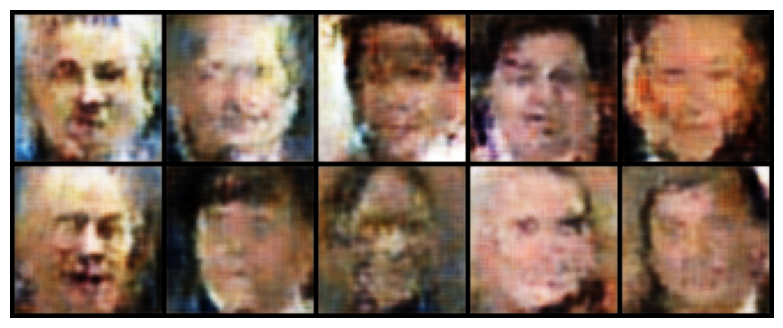

Training Progress:  12%|█▏        | 12/100 [08:15<56:55, 38.82s/it]

Epoch [11/100]: Avg Gen Acc: -69.4511, Avg Disc Real Acc: -59.3673, Avg Disc Fake Acc: -68.7319


Training Progress:  13%|█▎        | 13/100 [08:55<56:37, 39.05s/it]

Epoch [12/100]: Avg Gen Acc: -69.2103, Avg Disc Real Acc: -59.2886, Avg Disc Fake Acc: -68.3304


Training Progress:  14%|█▍        | 14/100 [09:35<56:45, 39.59s/it]

Epoch [13/100]: Avg Gen Acc: -68.9478, Avg Disc Real Acc: -59.2962, Avg Disc Fake Acc: -68.0636


Training Progress:  15%|█▌        | 15/100 [10:16<56:25, 39.82s/it]

Epoch [14/100]: Avg Gen Acc: -68.5394, Avg Disc Real Acc: -59.0786, Avg Disc Fake Acc: -67.7202
Epoch [15/100]: Avg Gen Acc: -68.6416, Avg Disc Real Acc: -59.3460, Avg Disc Fake Acc: -67.7361


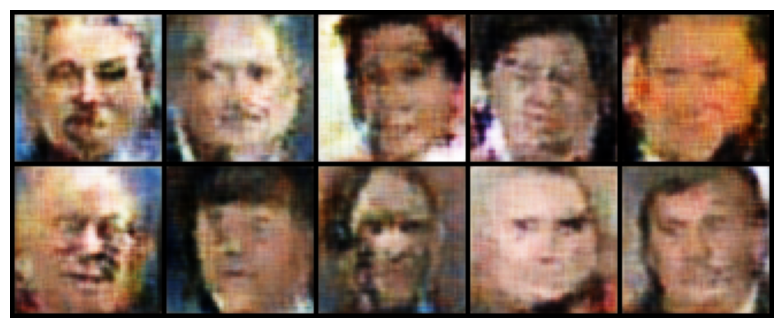

Training Progress:  17%|█▋        | 17/100 [11:37<55:34, 40.18s/it]

Epoch [16/100]: Avg Gen Acc: -68.1873, Avg Disc Real Acc: -59.1478, Avg Disc Fake Acc: -67.2967


Training Progress:  18%|█▊        | 18/100 [12:17<54:44, 40.06s/it]

Epoch [17/100]: Avg Gen Acc: -68.3017, Avg Disc Real Acc: -59.4858, Avg Disc Fake Acc: -67.4100


Training Progress:  19%|█▉        | 19/100 [12:58<54:31, 40.39s/it]

Epoch [18/100]: Avg Gen Acc: -68.0297, Avg Disc Real Acc: -59.4592, Avg Disc Fake Acc: -67.2632


Training Progress:  20%|██        | 20/100 [13:39<54:19, 40.74s/it]

Epoch [19/100]: Avg Gen Acc: -67.9194, Avg Disc Real Acc: -59.5375, Avg Disc Fake Acc: -67.1643
Epoch [20/100]: Avg Gen Acc: -68.1118, Avg Disc Real Acc: -59.6476, Avg Disc Fake Acc: -67.1331


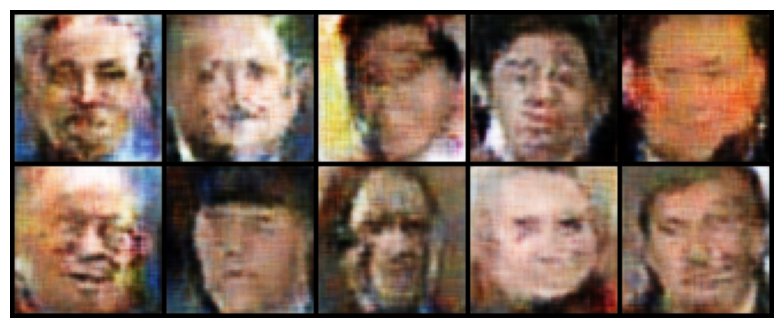

Training Progress:  22%|██▏       | 22/100 [15:02<53:05, 40.84s/it]

Epoch [21/100]: Avg Gen Acc: -67.8544, Avg Disc Real Acc: -59.6701, Avg Disc Fake Acc: -67.0467


Training Progress:  23%|██▎       | 23/100 [15:42<52:11, 40.67s/it]

Epoch [22/100]: Avg Gen Acc: -68.1805, Avg Disc Real Acc: -59.8268, Avg Disc Fake Acc: -67.0745


Training Progress:  24%|██▍       | 24/100 [16:22<51:14, 40.45s/it]

Epoch [23/100]: Avg Gen Acc: -68.7704, Avg Disc Real Acc: -60.5610, Avg Disc Fake Acc: -67.6041


Training Progress:  25%|██▌       | 25/100 [17:02<50:20, 40.27s/it]

Epoch [24/100]: Avg Gen Acc: -67.8614, Avg Disc Real Acc: -59.8470, Avg Disc Fake Acc: -66.9027
Epoch [25/100]: Avg Gen Acc: -68.7384, Avg Disc Real Acc: -60.7122, Avg Disc Fake Acc: -67.6234


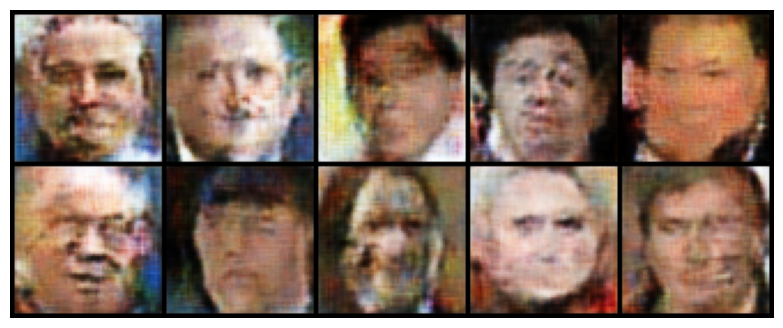

Training Progress:  27%|██▋       | 27/100 [18:21<48:42, 40.03s/it]

Epoch [26/100]: Avg Gen Acc: -68.3789, Avg Disc Real Acc: -60.8019, Avg Disc Fake Acc: -67.5453


Training Progress:  28%|██▊       | 28/100 [18:58<46:46, 38.98s/it]

Epoch [27/100]: Avg Gen Acc: -68.8196, Avg Disc Real Acc: -60.9473, Avg Disc Fake Acc: -67.6855


Training Progress:  29%|██▉       | 29/100 [19:35<45:34, 38.52s/it]

Epoch [28/100]: Avg Gen Acc: -68.4924, Avg Disc Real Acc: -60.8741, Avg Disc Fake Acc: -67.5773


Training Progress:  30%|███       | 30/100 [20:16<45:40, 39.15s/it]

Epoch [29/100]: Avg Gen Acc: -68.0813, Avg Disc Real Acc: -60.4256, Avg Disc Fake Acc: -66.9495
Epoch [30/100]: Avg Gen Acc: -67.7291, Avg Disc Real Acc: -60.2914, Avg Disc Fake Acc: -66.8007


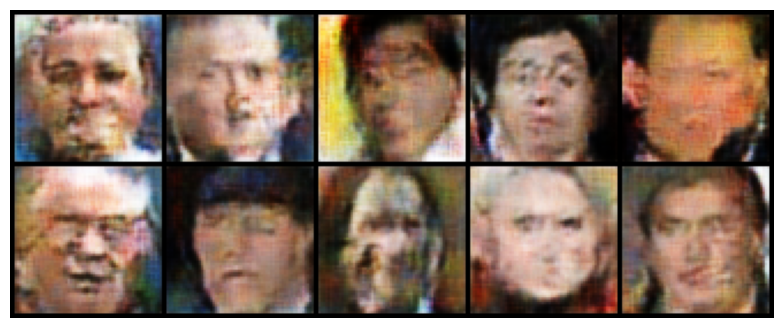

Training Progress:  32%|███▏      | 32/100 [21:34<44:18, 39.09s/it]

Epoch [31/100]: Avg Gen Acc: -68.1285, Avg Disc Real Acc: -60.8180, Avg Disc Fake Acc: -67.1538


Training Progress:  33%|███▎      | 33/100 [22:13<43:41, 39.12s/it]

Epoch [32/100]: Avg Gen Acc: -67.0136, Avg Disc Real Acc: -59.9109, Avg Disc Fake Acc: -66.1630


Training Progress:  34%|███▍      | 34/100 [22:51<42:38, 38.77s/it]

Epoch [33/100]: Avg Gen Acc: -67.3430, Avg Disc Real Acc: -60.1580, Avg Disc Fake Acc: -66.3222


Training Progress:  35%|███▌      | 35/100 [23:30<42:07, 38.89s/it]

Epoch [34/100]: Avg Gen Acc: -67.4055, Avg Disc Real Acc: -60.2698, Avg Disc Fake Acc: -66.4533
Epoch [35/100]: Avg Gen Acc: -66.4899, Avg Disc Real Acc: -59.5066, Avg Disc Fake Acc: -65.5640


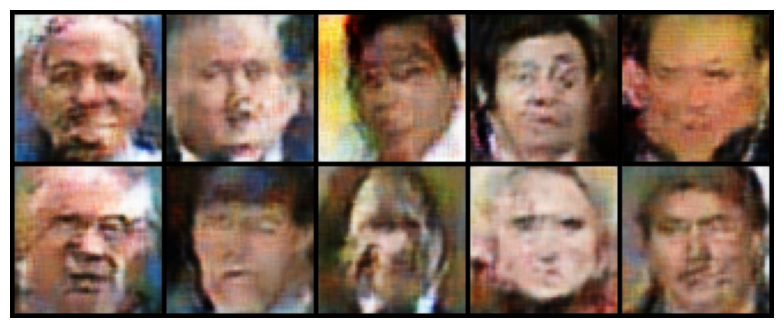

Training Progress:  37%|███▋      | 37/100 [24:49<40:51, 38.92s/it]

Epoch [36/100]: Avg Gen Acc: -65.3690, Avg Disc Real Acc: -58.5189, Avg Disc Fake Acc: -64.4912


Training Progress:  38%|███▊      | 38/100 [25:27<40:04, 38.78s/it]

Epoch [37/100]: Avg Gen Acc: -65.7100, Avg Disc Real Acc: -58.8639, Avg Disc Fake Acc: -64.8475


Training Progress:  39%|███▉      | 39/100 [26:07<39:51, 39.20s/it]

Epoch [38/100]: Avg Gen Acc: -65.2955, Avg Disc Real Acc: -58.5429, Avg Disc Fake Acc: -64.4767


Training Progress:  40%|████      | 40/100 [26:43<38:05, 38.08s/it]

Epoch [39/100]: Avg Gen Acc: -65.3439, Avg Disc Real Acc: -58.3368, Avg Disc Fake Acc: -64.2291
Epoch [40/100]: Avg Gen Acc: -64.9813, Avg Disc Real Acc: -58.1320, Avg Disc Fake Acc: -63.8736


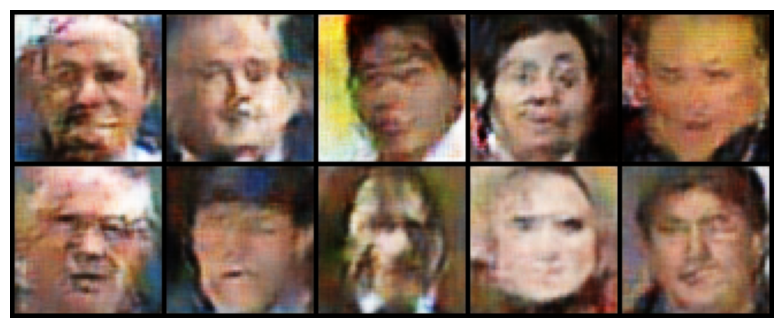

Training Progress:  42%|████▏     | 42/100 [28:02<37:37, 38.92s/it]

Epoch [41/100]: Avg Gen Acc: -65.6301, Avg Disc Real Acc: -59.0468, Avg Disc Fake Acc: -64.7325


Training Progress:  43%|████▎     | 43/100 [28:42<37:12, 39.16s/it]

Epoch [42/100]: Avg Gen Acc: -64.6038, Avg Disc Real Acc: -58.1122, Avg Disc Fake Acc: -63.7160


Training Progress:  44%|████▍     | 44/100 [29:21<36:32, 39.14s/it]

Epoch [43/100]: Avg Gen Acc: -64.3136, Avg Disc Real Acc: -57.7745, Avg Disc Fake Acc: -63.2997


Training Progress:  45%|████▌     | 45/100 [29:59<35:46, 39.02s/it]

Epoch [44/100]: Avg Gen Acc: -64.9320, Avg Disc Real Acc: -58.4961, Avg Disc Fake Acc: -63.9516
Epoch [45/100]: Avg Gen Acc: -65.1356, Avg Disc Real Acc: -58.6547, Avg Disc Fake Acc: -64.0191


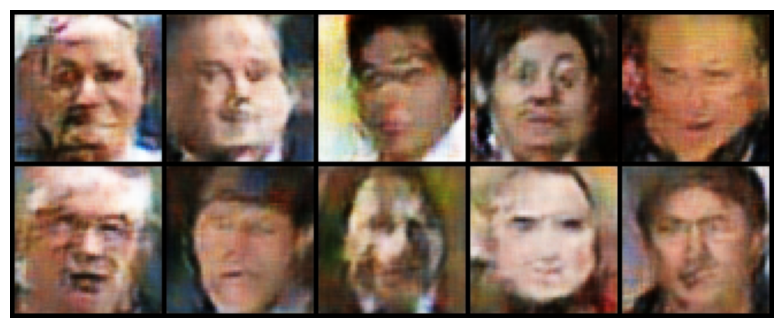

Training Progress:  47%|████▋     | 47/100 [31:15<33:55, 38.41s/it]

Epoch [46/100]: Avg Gen Acc: -64.5474, Avg Disc Real Acc: -58.0848, Avg Disc Fake Acc: -63.4689


Training Progress:  48%|████▊     | 48/100 [31:53<33:09, 38.26s/it]

Epoch [47/100]: Avg Gen Acc: -63.4082, Avg Disc Real Acc: -57.2989, Avg Disc Fake Acc: -62.5008


Training Progress:  49%|████▉     | 49/100 [32:31<32:24, 38.13s/it]

Epoch [48/100]: Avg Gen Acc: -62.3118, Avg Disc Real Acc: -56.1809, Avg Disc Fake Acc: -61.4501


Training Progress:  50%|█████     | 50/100 [33:09<31:51, 38.22s/it]

Epoch [49/100]: Avg Gen Acc: -61.7789, Avg Disc Real Acc: -55.6349, Avg Disc Fake Acc: -60.8400
Epoch [50/100]: Avg Gen Acc: -61.5252, Avg Disc Real Acc: -55.6482, Avg Disc Fake Acc: -60.6301


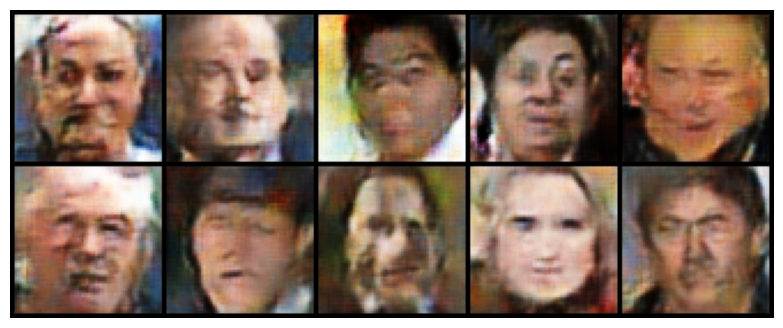

Training Progress:  52%|█████▏    | 52/100 [34:27<30:53, 38.61s/it]

Epoch [51/100]: Avg Gen Acc: -61.7242, Avg Disc Real Acc: -55.9257, Avg Disc Fake Acc: -60.8240


Training Progress:  53%|█████▎    | 53/100 [35:07<30:28, 38.90s/it]

Epoch [52/100]: Avg Gen Acc: -61.5954, Avg Disc Real Acc: -55.6248, Avg Disc Fake Acc: -60.6587


Training Progress:  54%|█████▍    | 54/100 [35:44<29:28, 38.45s/it]

Epoch [53/100]: Avg Gen Acc: -60.9417, Avg Disc Real Acc: -55.0167, Avg Disc Fake Acc: -59.9725


Training Progress:  55%|█████▌    | 55/100 [36:22<28:44, 38.32s/it]

Epoch [54/100]: Avg Gen Acc: -59.5032, Avg Disc Real Acc: -53.8364, Avg Disc Fake Acc: -58.7044
Epoch [55/100]: Avg Gen Acc: -58.9058, Avg Disc Real Acc: -53.1515, Avg Disc Fake Acc: -57.8845


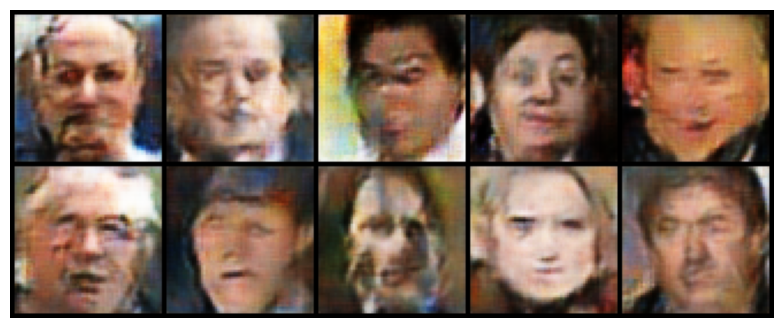

Training Progress:  57%|█████▋    | 57/100 [37:41<28:01, 39.10s/it]

Epoch [56/100]: Avg Gen Acc: -59.3448, Avg Disc Real Acc: -53.5915, Avg Disc Fake Acc: -58.3957


Training Progress:  58%|█████▊    | 58/100 [38:21<27:29, 39.26s/it]

Epoch [57/100]: Avg Gen Acc: -58.8607, Avg Disc Real Acc: -53.0407, Avg Disc Fake Acc: -57.8145


Training Progress:  59%|█████▉    | 59/100 [39:00<26:50, 39.29s/it]

Epoch [58/100]: Avg Gen Acc: -58.3561, Avg Disc Real Acc: -52.8489, Avg Disc Fake Acc: -57.5012


Training Progress:  60%|██████    | 60/100 [39:40<26:12, 39.32s/it]

Epoch [59/100]: Avg Gen Acc: -58.5751, Avg Disc Real Acc: -53.0816, Avg Disc Fake Acc: -57.7061
Epoch [60/100]: Avg Gen Acc: -56.4002, Avg Disc Real Acc: -51.0456, Avg Disc Fake Acc: -55.5824


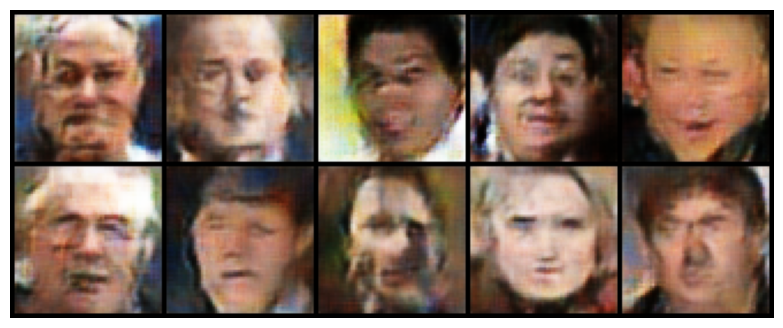

Training Progress:  62%|██████▏   | 62/100 [40:58<24:45, 39.09s/it]

Epoch [61/100]: Avg Gen Acc: -55.8438, Avg Disc Real Acc: -50.3282, Avg Disc Fake Acc: -54.8876


Training Progress:  63%|██████▎   | 63/100 [41:37<24:05, 39.07s/it]

Epoch [62/100]: Avg Gen Acc: -51.0624, Avg Disc Real Acc: -45.8160, Avg Disc Fake Acc: -50.2464


Training Progress:  64%|██████▍   | 64/100 [42:16<23:28, 39.12s/it]

Epoch [63/100]: Avg Gen Acc: -50.6507, Avg Disc Real Acc: -45.3753, Avg Disc Fake Acc: -49.7341


Training Progress:  65%|██████▌   | 65/100 [42:57<23:08, 39.68s/it]

Epoch [64/100]: Avg Gen Acc: -52.1289, Avg Disc Real Acc: -46.9391, Avg Disc Fake Acc: -51.2567
Epoch [65/100]: Avg Gen Acc: -53.5584, Avg Disc Real Acc: -48.4298, Avg Disc Fake Acc: -52.6203


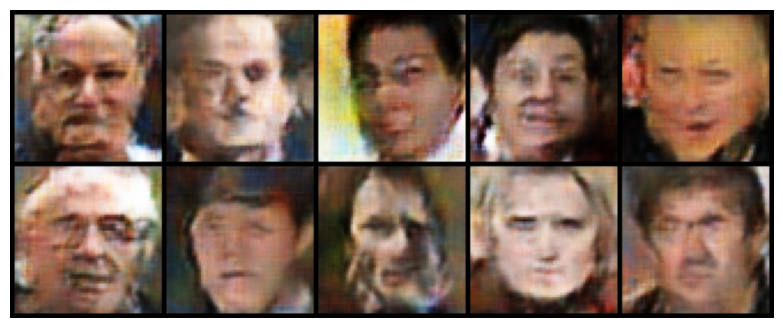

Training Progress:  67%|██████▋   | 67/100 [44:14<21:24, 38.91s/it]

Epoch [66/100]: Avg Gen Acc: -52.0451, Avg Disc Real Acc: -46.9045, Avg Disc Fake Acc: -51.1828


Training Progress:  68%|██████▊   | 68/100 [44:53<20:52, 39.14s/it]

Epoch [67/100]: Avg Gen Acc: -51.9287, Avg Disc Real Acc: -46.8781, Avg Disc Fake Acc: -51.0100


Training Progress:  69%|██████▉   | 69/100 [45:33<20:14, 39.19s/it]

Epoch [68/100]: Avg Gen Acc: -48.3108, Avg Disc Real Acc: -43.3011, Avg Disc Fake Acc: -47.4486


Training Progress:  70%|███████   | 70/100 [46:15<20:04, 40.14s/it]

Epoch [69/100]: Avg Gen Acc: -44.4775, Avg Disc Real Acc: -39.5340, Avg Disc Fake Acc: -43.6861
Epoch [70/100]: Avg Gen Acc: -47.1295, Avg Disc Real Acc: -42.2905, Avg Disc Fake Acc: -46.3031


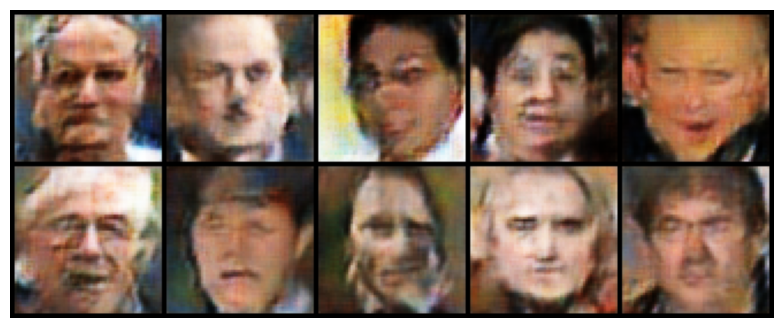

Training Progress:  72%|███████▏  | 72/100 [47:34<18:36, 39.86s/it]

Epoch [71/100]: Avg Gen Acc: -46.3735, Avg Disc Real Acc: -41.4621, Avg Disc Fake Acc: -45.5625


Training Progress:  73%|███████▎  | 73/100 [48:13<17:50, 39.65s/it]

Epoch [72/100]: Avg Gen Acc: -42.3677, Avg Disc Real Acc: -37.5034, Avg Disc Fake Acc: -41.4628


Training Progress:  74%|███████▍  | 74/100 [48:54<17:22, 40.09s/it]

Epoch [73/100]: Avg Gen Acc: -42.2018, Avg Disc Real Acc: -37.5776, Avg Disc Fake Acc: -41.3604


Training Progress:  75%|███████▌  | 75/100 [49:34<16:35, 39.84s/it]

Epoch [74/100]: Avg Gen Acc: -40.8436, Avg Disc Real Acc: -36.2545, Avg Disc Fake Acc: -40.0737
Epoch [75/100]: Avg Gen Acc: -37.5980, Avg Disc Real Acc: -33.0814, Avg Disc Fake Acc: -36.7482


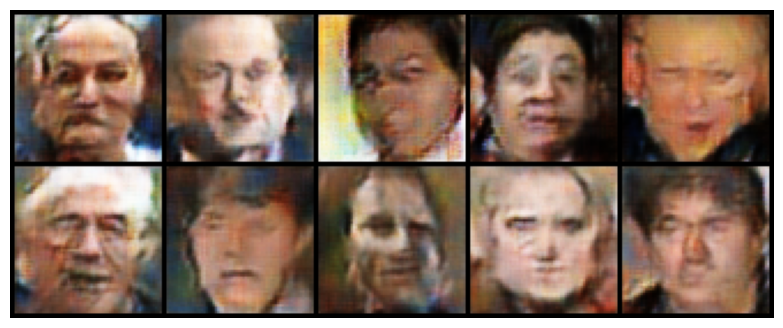

Training Progress:  77%|███████▋  | 77/100 [50:53<15:15, 39.79s/it]

Epoch [76/100]: Avg Gen Acc: -33.9828, Avg Disc Real Acc: -29.7564, Avg Disc Fake Acc: -33.3338


Training Progress:  78%|███████▊  | 78/100 [51:32<14:27, 39.43s/it]

Epoch [77/100]: Avg Gen Acc: -33.9497, Avg Disc Real Acc: -29.6796, Avg Disc Fake Acc: -33.0896


Training Progress:  79%|███████▉  | 79/100 [52:10<13:37, 38.91s/it]

Epoch [78/100]: Avg Gen Acc: -35.0442, Avg Disc Real Acc: -30.7910, Avg Disc Fake Acc: -34.3278


Training Progress:  80%|████████  | 80/100 [52:49<12:58, 38.92s/it]

Epoch [79/100]: Avg Gen Acc: -25.3392, Avg Disc Real Acc: -21.6365, Avg Disc Fake Acc: -24.6910
Epoch [80/100]: Avg Gen Acc: -24.8762, Avg Disc Real Acc: -21.3491, Avg Disc Fake Acc: -24.2609


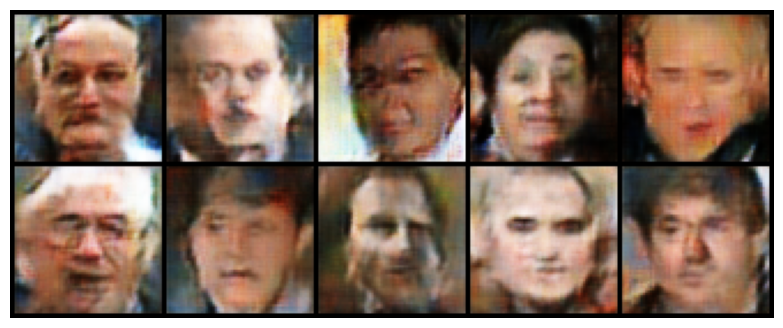

Training Progress:  82%|████████▏ | 82/100 [54:06<11:39, 38.86s/it]

Epoch [81/100]: Avg Gen Acc: -22.7415, Avg Disc Real Acc: -19.5405, Avg Disc Fake Acc: -22.0796


Training Progress:  83%|████████▎ | 83/100 [54:45<11:00, 38.85s/it]

Epoch [82/100]: Avg Gen Acc: -9.8733, Avg Disc Real Acc: -6.8025, Avg Disc Fake Acc: -9.1960


Training Progress:  84%|████████▍ | 84/100 [55:23<10:20, 38.77s/it]

Epoch [83/100]: Avg Gen Acc: -1.8261, Avg Disc Real Acc: 0.8199, Avg Disc Fake Acc: -1.2979


Training Progress:  85%|████████▌ | 85/100 [56:02<09:43, 38.88s/it]

Epoch [84/100]: Avg Gen Acc: -0.4889, Avg Disc Real Acc: 2.1909, Avg Disc Fake Acc: 0.1759
Epoch [85/100]: Avg Gen Acc: 8.2117, Avg Disc Real Acc: 10.4197, Avg Disc Fake Acc: 8.6901


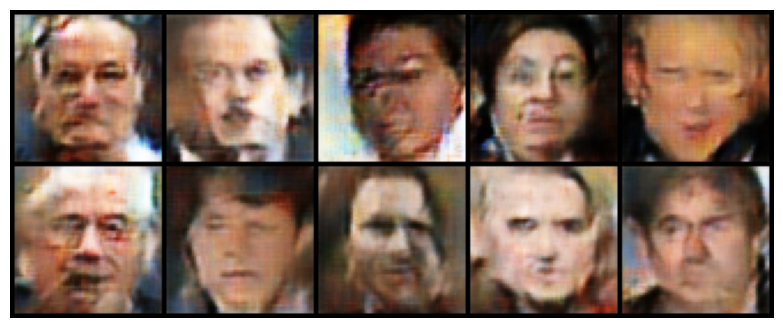

Training Progress:  87%|████████▋ | 87/100 [57:19<08:19, 38.44s/it]

Epoch [86/100]: Avg Gen Acc: 22.0010, Avg Disc Real Acc: 24.3547, Avg Disc Fake Acc: 22.5164


Training Progress:  88%|████████▊ | 88/100 [57:57<07:40, 38.34s/it]

Epoch [87/100]: Avg Gen Acc: 32.2236, Avg Disc Real Acc: 34.4583, Avg Disc Fake Acc: 32.7127


Training Progress:  89%|████████▉ | 89/100 [58:37<07:08, 38.92s/it]

Epoch [88/100]: Avg Gen Acc: 40.9744, Avg Disc Real Acc: 43.1168, Avg Disc Fake Acc: 41.4117


Training Progress:  90%|█████████ | 90/100 [59:17<06:31, 39.10s/it]

Epoch [89/100]: Avg Gen Acc: 50.3759, Avg Disc Real Acc: 52.5718, Avg Disc Fake Acc: 50.8729
Epoch [90/100]: Avg Gen Acc: 38.3795, Avg Disc Real Acc: 40.6351, Avg Disc Fake Acc: 38.8727


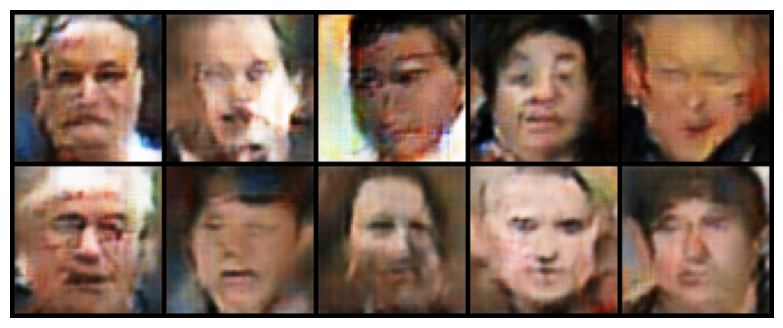

Training Progress:  92%|█████████▏| 92/100 [1:00:28<04:58, 37.33s/it]

Epoch [91/100]: Avg Gen Acc: 36.0265, Avg Disc Real Acc: 38.4091, Avg Disc Fake Acc: 36.5562


Training Progress:  93%|█████████▎| 93/100 [1:01:07<04:24, 37.79s/it]

Epoch [92/100]: Avg Gen Acc: 38.3995, Avg Disc Real Acc: 40.4158, Avg Disc Fake Acc: 38.8392


Training Progress:  94%|█████████▍| 94/100 [1:01:46<03:48, 38.05s/it]

Epoch [93/100]: Avg Gen Acc: 49.8375, Avg Disc Real Acc: 52.0803, Avg Disc Fake Acc: 50.3552


Training Progress:  95%|█████████▌| 95/100 [1:02:24<03:11, 38.26s/it]

Epoch [94/100]: Avg Gen Acc: 53.0958, Avg Disc Real Acc: 55.0378, Avg Disc Fake Acc: 53.4384
Epoch [95/100]: Avg Gen Acc: 57.3073, Avg Disc Real Acc: 59.3309, Avg Disc Fake Acc: 57.7314


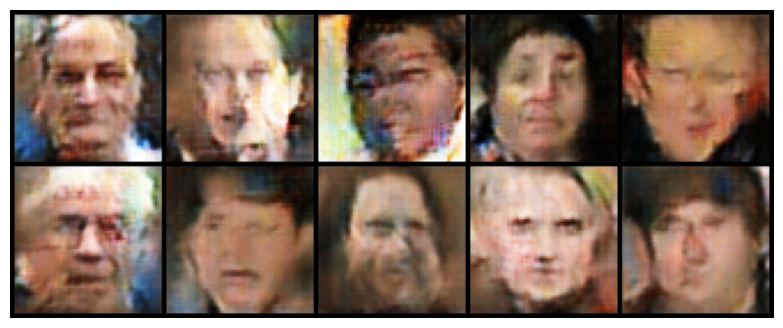

Training Progress:  97%|█████████▋| 97/100 [1:03:44<01:56, 38.84s/it]

Epoch [96/100]: Avg Gen Acc: 68.9046, Avg Disc Real Acc: 71.1790, Avg Disc Fake Acc: 69.4652


Training Progress:  98%|█████████▊| 98/100 [1:04:21<01:16, 38.26s/it]

Epoch [97/100]: Avg Gen Acc: 66.6654, Avg Disc Real Acc: 68.7123, Avg Disc Fake Acc: 67.1789


Training Progress:  99%|█████████▉| 99/100 [1:05:00<00:38, 38.65s/it]

Epoch [98/100]: Avg Gen Acc: 68.8534, Avg Disc Real Acc: 70.8826, Avg Disc Fake Acc: 69.2735


Training Progress: 100%|██████████| 100/100 [1:05:40<00:00, 39.40s/it]

Epoch [99/100]: Avg Gen Acc: 62.4239, Avg Disc Real Acc: 64.4914, Avg Disc Fake Acc: 62.8982


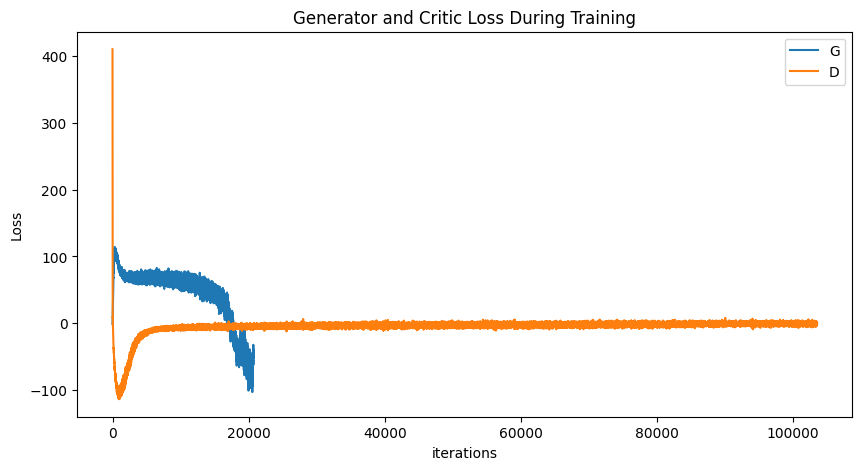

(Generator(
   (net): Sequential(
     (0): Sequential(
       (0): ConvTranspose2d(100, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
       (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       (2): ReLU()
     )
     (1): Sequential(
       (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
       (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       (2): ReLU()
     )
     (2): Sequential(
       (0): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
       (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       (2): ReLU()
     )
     (3): Sequential(
       (0): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
       (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       (2): ReLU()
     )
     (4): ConvTrans

In [15]:
train_gan_v2(gen, critic, loader, NUM_EPOCHS, Z_DIM, device, LEARNING_RATE, (0.0, 0.9), CRITIC_ITERATIONS, LAMBDA_GP , display_step=5)

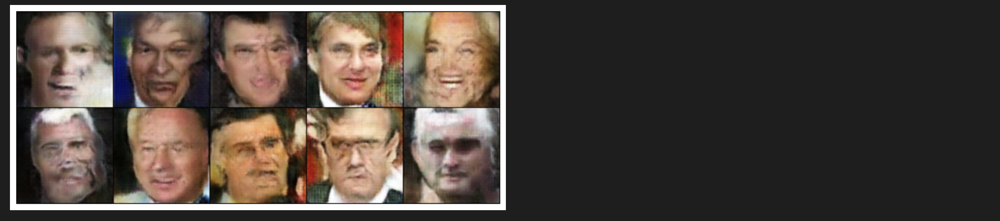

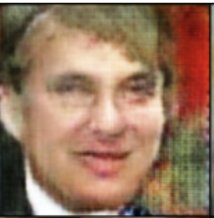

# Bonus Question : C-GAN 

### -  Modify the GAN to become a conditional GAN, where the condition itself is (features of) a real face image. The CGAN should generate another image of the same person, and you can use the Siamese network from Part-A as an additional discriminator for person matching. You will need to ensure that it does not simply show the same image as the one used for conditional input. 

### - SIAMESE NETWORK CLASS

In [22]:
class SiameseEfficientNetWithCustomEmbedding(nn.Module):
    def __init__(self, custom_embedding_dim, efficientnet_version="efficientnet_b0", 
                 unfreeze_layers=0, dropout_rate=0.5):  # <-- Add dropout_rate parameter
        super(SiameseEfficientNetWithCustomEmbedding, self).__init__()
        
        self.efficientnet = timm.create_model(efficientnet_version, pretrained=True)
        
        # Freeze all layers first
        for param in self.efficientnet.parameters():
            param.requires_grad = False
        
                # Unfreeze the last 'unfreeze_layers' layers
        if unfreeze_layers > 0:
            num_unfrozen = 0
            for stage in reversed(self.efficientnet.blocks):  # Start from the last stage
                for block in reversed(stage):  # Start from the last block
                    for param in block.parameters():
                        param.requires_grad = True
                        num_unfrozen += 1
                        if num_unfrozen == unfreeze_layers:
                            break
                    if num_unfrozen == unfreeze_layers:
                        break
                if num_unfrozen == unfreeze_layers:
                    break
        
        self.features = nn.Sequential(*list(self.efficientnet.children())[:-1])
        feature_dim = self.efficientnet.classifier.in_features  
        self.flatten = nn.Flatten()
        self.custom_embedding_layer = nn.Linear(feature_dim, custom_embedding_dim)
        self.dropout = nn.Dropout(p=dropout_rate)  

    def forward_one(self, x):
        x = self.features(x)
        x = self.flatten(x)
        x = self.dropout(x)  
        x = self.custom_embedding_layer(x)
        return x

    def forward(self, input1, input2):
        # Get embeddings for each input
        output1 = self.forward_one(input1)
        output2 = self.forward_one(input2)
        return output1, output2

### Importing out trained Siamese Network

In [23]:
model = SiameseEfficientNetWithCustomEmbedding(custom_embedding_dim=512)
model_path = "/raid/biplab/phduser1/Uddeshya/GANS/modelY6unfreeze_best.pth"
model.load_state_dict(torch.load(model_path))

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelNew = model.to(device)

### - Conditional Generator 

- The ConditionalGenerator is a specialized version of the generator which is adapted to use condition-based generation, in this case, an embedding.
- The generator is initialized with a modified noise dimension, which is the sum of z_dim (the original noise dimension) and embedding_dim (the dimension of the conditional embedding). This means the generator now accepts concatenated input of noise and the embedding.
- The embedding is reshaped to match the spatial dimensions of the noise. If the noise has a shape [batch_size, z_dim, 1, 1], after reshaping, the embedding will also have a similar 4D shape but with a depth of embedding_dim.
- The reshaped embedding is then concatenated with the noise along the channel dimension. This combined tensor serves as the input to the generator.
- This concatenated tensor is then passed through the generator (self.gen), producing an output image conditioned on the provided embedding.

In [24]:
class ConditionalGenerator(nn.Module):
    def __init__(self, z_dim, embedding_dim, img_channels, features_g):
        super(ConditionalGenerator, self).__init__()
        self.gen = Generator(z_dim + embedding_dim, img_channels, features_g)  # Updated input dimension

    def forward(self, noise, embedding):
        # Reshape embedding to have the same dimensions as noise
        embedding = embedding.unsqueeze(2).unsqueeze(3)
        x = torch.cat([noise, embedding], dim=1)  # Concatenate along the channel dimension
        return self.gen(x)

### - Conditional Discriminator

- The discriminator is initialized with a modified image channel size, which is the sum of channels_img (3) and embedding_dim (the dimension of the conditional embedding). This implies that the discriminator now accepts concatenated input of the image and the spatially expanded embedding.
- Before passing the image (x) to the discriminator, the embedding is spatially reshaped to match the image's dimensions. Specifically, the embedding is first unsqueezed to obtain a 4D shape (with spatial dimensions of 1x1). It's then spatially expanded to match the height and width of the image using the expand method.
- This reshaped embedding is then concatenated with the image along the channel dimension. As a result, the depth (or number of channels) of this concatenated tensor becomes channels_img + embedding_dim.
- This concatenated tensor is then fed into the discriminator (self.disc), which determines if the input image is real or fake, but now in the context of the provided embedding.

In [25]:
class ConditionalDiscriminator(nn.Module):
    def __init__(self, channels_img, embedding_dim, features_d):
        super(ConditionalDiscriminator, self).__init__()
        self.disc = Discriminator(channels_img + embedding_dim, features_d)

    def forward(self, x, embedding):
        x = torch.cat([x, embedding.unsqueeze(2).unsqueeze(3).expand(-1, -1, x.shape[2], x.shape[3])], dim=1)
        return self.disc(x)

### - Training Loop Conditional Gan

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
LEARNING_RATE = 1e-4
BATCH_SIZE = 64
IMAGE_SIZE = 64
CHANNELS_IMG = 3
Z_DIM = 100
NUM_EPOCHS = 60
FEATURES_CRITIC = 64
FEATURES_GEN = 64
CRITIC_ITERATIONS = 2
LAMBDA_GP = 10    

In [31]:
model = SiameseEfficientNetWithCustomEmbedding(128)
model.to(device)

SiameseEfficientNetWithCustomEmbedding(
  (efficientnet): EfficientNet(
    (conv_stem): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): BatchNormAct2d(
      32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True
      (drop): Identity()
      (act): SiLU(inplace=True)
    )
    (blocks): Sequential(
      (0): Sequential(
        (0): DepthwiseSeparableConv(
          (conv_dw): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (bn1): BatchNormAct2d(
            32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True
            (drop): Identity()
            (act): SiLU(inplace=True)
          )
          (se): SqueezeExcite(
            (conv_reduce): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (act1): SiLU(inplace=True)
            (conv_expand): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (gate): Sigmoid()
          )
          (conv_pw

In [28]:
model2 = SiameseEfficientNetWithCustomEmbedding(128).to(device)

In [29]:
from torch.nn.functional import mse_loss

def train_cgan(gen, disc, siamese_model, loader, num_epochs, z_dim, device, lr, betas, lambda_penalty=0.1, display_step=5): 
    siamese_model.eval()
    opt_gen = optim.Adam(gen.parameters(), lr=lr, betas=betas)
    opt_disc = optim.Adam(disc.parameters(), lr=lr, betas=betas)
    criterion = nn.BCEWithLogitsLoss()

    # Lists to store losses for every iteration for plotting
    gen_losses = []
    disc_losses = []

    for epoch in range(num_epochs):
        loop = notebook_tqdm(loader, total=len(loader), leave=True)
        for real in loop:
            real = real.to(device)
            cur_batch_size = real.shape[0]
            noise = torch.randn(cur_batch_size, z_dim, 1, 1).to(device)
            
            # Get the embeddings using the my siamese model
            real_embedding, _ = siamese_model(real, real)
            
            # Generate fake images using the generator
            fake = gen(noise, real_embedding)
            
            # Discriminator's forward pass and loss computation
            disc_real = disc(real, real_embedding).reshape(-1)
            loss_disc_real = criterion(disc_real, torch.ones_like(disc_real))
            disc_fake = disc(fake.detach(), real_embedding).reshape(-1)
            loss_disc_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
            loss_disc = (loss_disc_real + loss_disc_fake) / 2
            
            # Update the discriminator
            disc.zero_grad()
            loss_disc.backward(retain_graph=True)
            opt_disc.step()
            # Generator's forward pass and loss computation
            output = disc(fake, real_embedding).reshape(-1)
            loss_gen = criterion(output, torch.ones_like(output))
            # Penalty for the generator if the output is too similar to the input
            mse_penalty = mse_loss(fake, real[:cur_batch_size])
            loss_gen += lambda_penalty * mse_penalty
            # Update the generator
            gen.zero_grad()
            loss_gen.backward()
            opt_gen.step()
    
            loop.set_description(f"Epoch [{epoch+1}/{num_epochs}]")
            loop.set_postfix(Disc_loss=loss_disc.item(), Gen_loss=loss_gen.item())

            # Append the losses for this iteration
            gen_losses.append(loss_gen.item())
            disc_losses.append(loss_disc.item())

        # Display one generated image alongside its corresponding real image every `display_step` epochs
        if (epoch + 1) % display_step == 0:
            with torch.no_grad():
                comparison_image = torch.cat([real[0], fake[0]], dim=2)  # Concatenate along width
                imshow(torchvision.utils.make_grid(comparison_image, normalize=True))
        
        print(f"Epoch [{epoch+1}/{num_epochs}] Loss D: {loss_disc:.4f}, Loss G: {loss_gen:.4f}")

    # Plotting the losses after training
    plt.figure(figsize=(10, 5))
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(gen_losses, label="Generator Loss")
    plt.plot(disc_losses, label="Discriminator Loss")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [1/60] Loss D: 0.5060, Loss G: 0.6953


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [2/60] Loss D: 0.5032, Loss G: 0.6954


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [3/60] Loss D: 0.5032, Loss G: 0.6953


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [4/60] Loss D: 0.5032, Loss G: 0.6952


  0%|          | 0/207 [00:00<?, ?it/s]

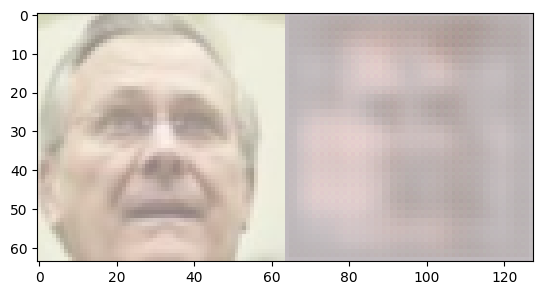

Epoch [5/60] Loss D: 0.5034, Loss G: 0.6951


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [6/60] Loss D: 0.5032, Loss G: 0.6953


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [7/60] Loss D: 0.5032, Loss G: 0.6952


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [8/60] Loss D: 0.5032, Loss G: 0.6950


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [9/60] Loss D: 0.5046, Loss G: 0.6955


  0%|          | 0/207 [00:00<?, ?it/s]

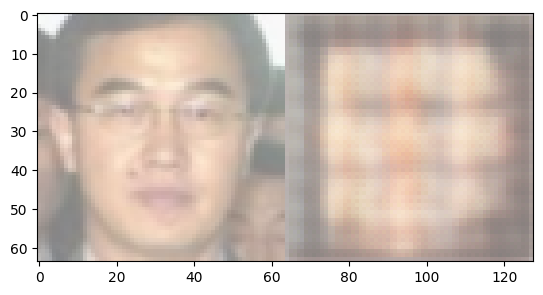

Epoch [10/60] Loss D: 0.8133, Loss G: 0.3157


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [11/60] Loss D: 0.8133, Loss G: 0.3154


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [12/60] Loss D: 0.8133, Loss G: 0.3152


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [13/60] Loss D: 0.8137, Loss G: 0.3153


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [14/60] Loss D: 0.8133, Loss G: 0.3171


  0%|          | 0/207 [00:00<?, ?it/s]

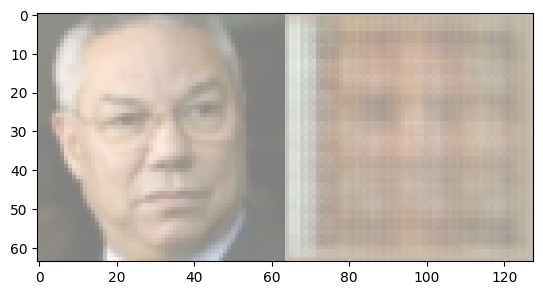

Epoch [15/60] Loss D: 0.8133, Loss G: 0.3156


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [16/60] Loss D: 0.8133, Loss G: 0.3152


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [17/60] Loss D: 0.8133, Loss G: 0.3150


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [18/60] Loss D: 0.8133, Loss G: 0.3149


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [19/60] Loss D: 0.8133, Loss G: 0.3149


  0%|          | 0/207 [00:00<?, ?it/s]

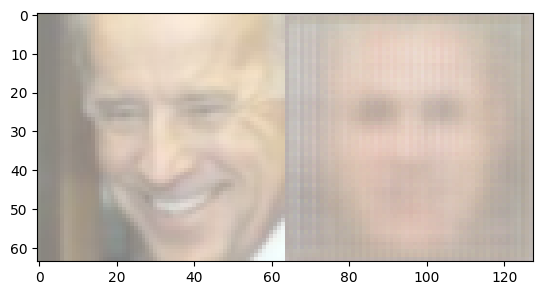

Epoch [20/60] Loss D: 0.8133, Loss G: 0.3148


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [21/60] Loss D: 0.8133, Loss G: 0.3148


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [22/60] Loss D: 0.8133, Loss G: 0.3148


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [23/60] Loss D: 0.8133, Loss G: 0.3147


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [24/60] Loss D: 0.8133, Loss G: 0.3148


  0%|          | 0/207 [00:00<?, ?it/s]

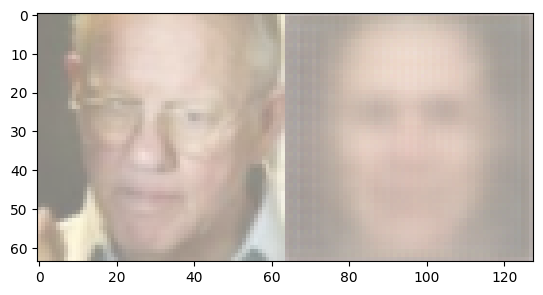

Epoch [25/60] Loss D: 0.8133, Loss G: 0.3146


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [26/60] Loss D: 0.8133, Loss G: 0.3148


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [27/60] Loss D: 0.8133, Loss G: 0.3149


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [28/60] Loss D: 0.8133, Loss G: 0.3147


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [29/60] Loss D: 0.8133, Loss G: 0.3150


  0%|          | 0/207 [00:00<?, ?it/s]

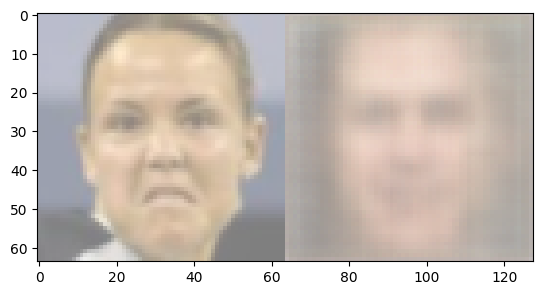

Epoch [30/60] Loss D: 0.8133, Loss G: 0.3148


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [31/60] Loss D: 0.8133, Loss G: 0.3148


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [32/60] Loss D: 0.8133, Loss G: 0.3147


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [33/60] Loss D: 0.8133, Loss G: 0.3148


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [34/60] Loss D: 0.8133, Loss G: 0.3148


  0%|          | 0/207 [00:00<?, ?it/s]

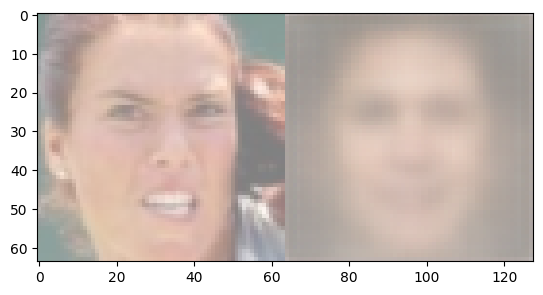

Epoch [35/60] Loss D: 0.8133, Loss G: 0.3149


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [36/60] Loss D: 0.8133, Loss G: 0.3148


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [37/60] Loss D: 0.8133, Loss G: 0.3149


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [38/60] Loss D: 0.8133, Loss G: 0.3147


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [39/60] Loss D: 0.8133, Loss G: 0.3148


  0%|          | 0/207 [00:00<?, ?it/s]

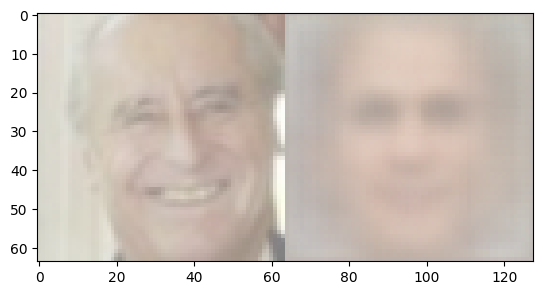

Epoch [40/60] Loss D: 0.8133, Loss G: 0.3147


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [41/60] Loss D: 0.8133, Loss G: 0.3147


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [42/60] Loss D: 0.8133, Loss G: 0.3148


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [43/60] Loss D: 0.8133, Loss G: 0.3147


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [44/60] Loss D: 0.8133, Loss G: 0.3149


  0%|          | 0/207 [00:00<?, ?it/s]

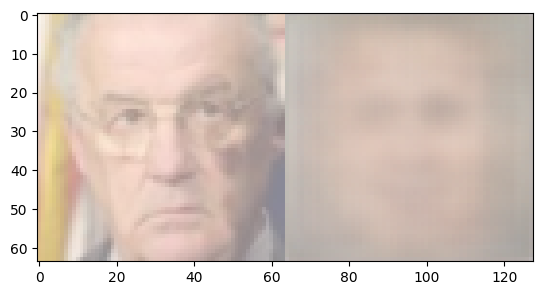

Epoch [45/60] Loss D: 0.8133, Loss G: 0.3147


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [46/60] Loss D: 0.8133, Loss G: 0.3147


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [47/60] Loss D: 0.6930, Loss G: 0.6871


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [48/60] Loss D: 0.6931, Loss G: 0.6948


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [49/60] Loss D: 0.6931, Loss G: 0.6949


  0%|          | 0/207 [00:00<?, ?it/s]

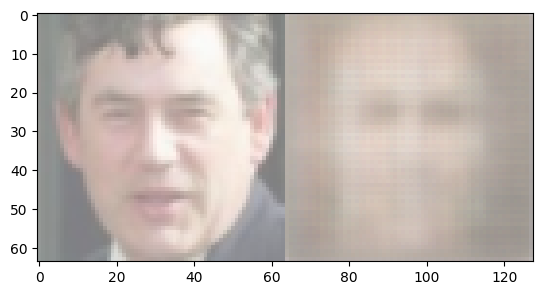

Epoch [50/60] Loss D: 0.6931, Loss G: 0.6947


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [51/60] Loss D: 0.6931, Loss G: 0.6948


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [52/60] Loss D: 0.6931, Loss G: 0.6946


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [53/60] Loss D: 0.6931, Loss G: 0.6947


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [54/60] Loss D: 0.6931, Loss G: 0.6947


  0%|          | 0/207 [00:00<?, ?it/s]

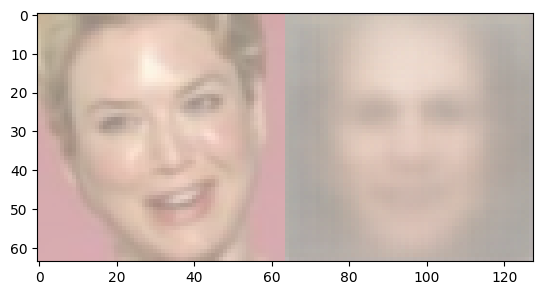

Epoch [55/60] Loss D: 0.6931, Loss G: 0.6946


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [56/60] Loss D: 0.6931, Loss G: 0.6947


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [57/60] Loss D: 0.6931, Loss G: 0.6947


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [58/60] Loss D: 0.6931, Loss G: 0.6946


  0%|          | 0/207 [00:00<?, ?it/s]

Epoch [59/60] Loss D: 0.6931, Loss G: 0.6946


  0%|          | 0/207 [00:00<?, ?it/s]

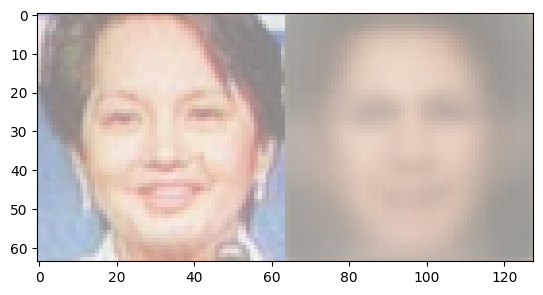

Epoch [60/60] Loss D: 0.6931, Loss G: 0.6946


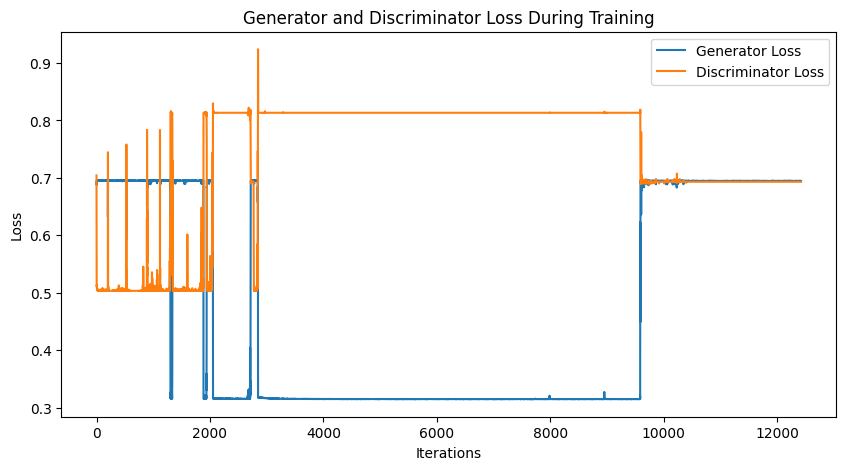

In [31]:
CUSTOM_EMBEDDING_DIM = 128 
gen2 = ConditionalGenerator(Z_DIM, CUSTOM_EMBEDDING_DIM, CHANNELS_IMG, FEATURES_GEN).to(device)
disc2 = ConditionalDiscriminator(CHANNELS_IMG, CUSTOM_EMBEDDING_DIM, FEATURES_CRITIC).to(device)
gen2.apply(initialize_weights)
disc2.apply(initialize_weights)
train_cgan(gen2, disc2, modelNew, loader, NUM_EPOCHS, Z_DIM, device, LEARNING_RATE, (0.5, 0.999) , lambda_penalty = 0.01 ,display_step=5)

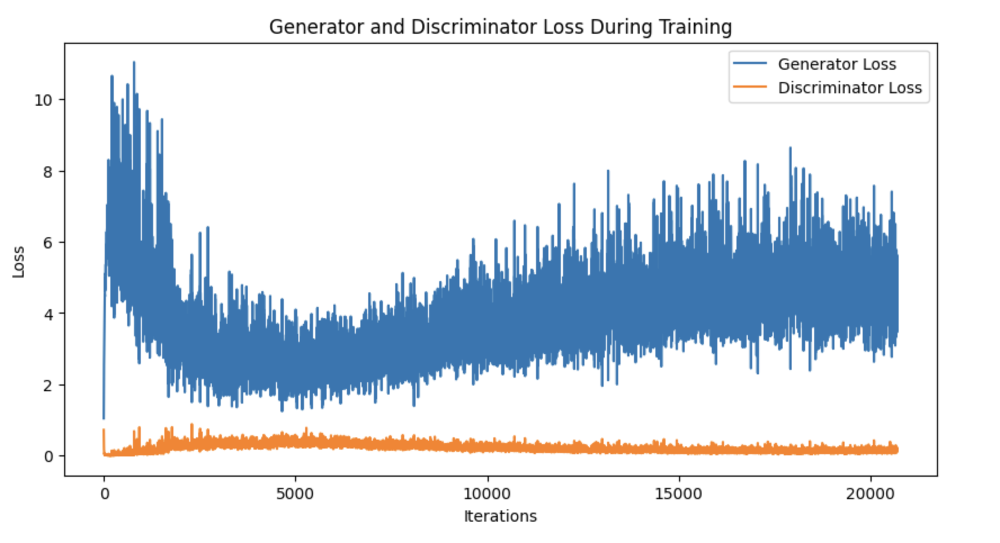

### In the above conditional GANs setting we can see , with more epochs the results are improving and Siamese Network and MSE penalty take care that the same image of a person is not generated , hence we have achieve the goal 

# Note:

### Trained for Image size 224X224 for 24 epoch only on DGX A100 machine , took 6 hours for just 24 epochs

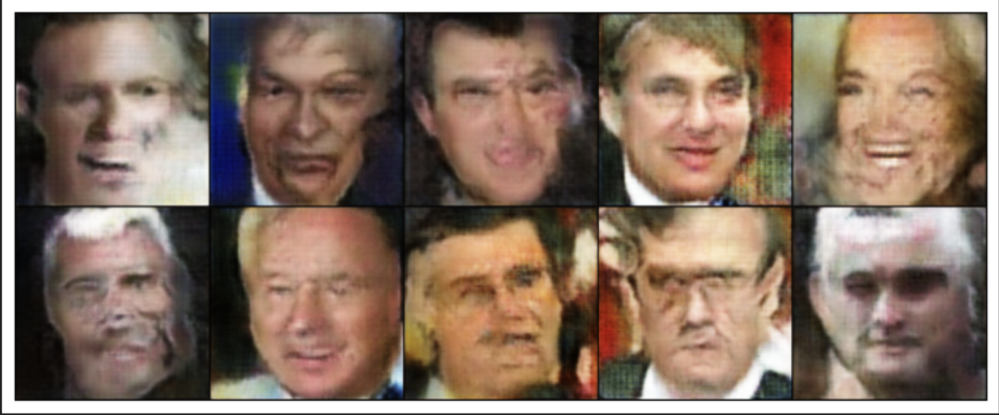

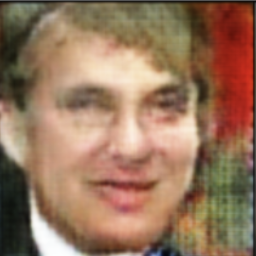

### With more compute , and more time , certainly results can be improved more where we can use high resolution input images for the GANs

# References        
        [1] https://www.youtube.com/playlist?list=PLhhyoLH6IjfwIp8bZnzX8QR30TRcHO8Va
        [2] https://chat.openai.com//
        [3] https://arxiv.org/abs/1701.07875
            

# Thankyou